<a href="https://colab.research.google.com/github/NastyaSNK/MISIS_DS_Masters_degree_2020/blob/master/internal_competitions/02_semesters/hakaton_1903/type.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [Intellivision](https://www.intelli-vision.com/): vehicle image clustering by vehicle type (vdc_type set study)


## File download

In [ ]:
#connection to the Google Disk. The instructions: https://docs.google.com/document/d/1cMHyY9hsKCv67PyFP5rE-PgMCbmZDcdp1j9lpXvYCqE/edit?usp=sharing
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pickle

#filename01 = '/content/drive/MyDrive/01_Hackathon_09/descriptors/efficientnet-b7.pickle'
#filename02 = '/content/drive/MyDrive/01_Hackathon_09/descriptors/vdc_type.pickle'
filename03 = '/content/drive/MyDrive/01_Hackathon_09/descriptors/vdc_type.pickle'
#filename04 = '/content/drive/MyDrive/01_Hackathon_09/descriptors/osnet.pickle'

#X_efficientnet = pickle.load(open(filename01, 'rb'))
#X_type = pickle.load(open(filename02, 'rb'))
X_type = pickle.load(open(filename03, 'rb'))
#X_osnet = pickle.load(open(filename04, 'rb'))

#print('efficientnet shape:{}\ntype shape:{}\ntype shape:{}\nosnet shape:{}'.format(X_efficientnet.shape,X_type.shape,X_type.shape,X_osnet.shape))
print('TYPE shape:{}'.format(X_type.shape))

TYPE shape:(416314, 512)


In [ ]:
X_type

array([[0.02564181, 0.00200849, 0.14198549, ..., 0.1284933 , 0.15204279,
        0.01345227],
       [0.00805954, 0.        , 0.13719751, ..., 0.07015307, 0.13695519,
        0.05582581],
       [0.03058972, 0.03774371, 0.01926565, ..., 0.05357384, 0.02103408,
        0.06070706],
       ...,
       [0.04895582, 0.02745031, 0.03123017, ..., 0.02064629, 0.11645781,
        0.27788612],
       [0.06860567, 0.        , 0.04587822, ..., 0.0141571 , 0.30611995,
        0.30511984],
       [0.0245354 , 0.01397088, 0.02359578, ..., 0.        , 0.23655881,
        0.34663343]], dtype=float32)

## Experiments with vdc_type data set

### Kmeans

In [ ]:
import pandas as pd
pd.DataFrame(X_type).describe()


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511
count,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,...,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000
mean,0.077829,0.041305,0.111429,0.222737,0.152735,0.176933,0.069649,0.143807,0.306854,0.205446,0.210687,0.093248,0.069371,0.325489,0.149333,0.168791,0.126831,0.026900,0.028500,0.044965,0.232685,0.194109,0.129232,0.110208,0.076784,0.162222,0.165878,0.134914,0.192949,0.056471,0.114089,0.043888,0.164264,0.174392,0.141211,0.249296,0.055542,0.190590,0.197357,0.096063,...,0.168778,0.131715,0.143386,0.106636,0.192808,0.115969,0.110373,0.138745,0.100448,0.182901,0.168004,0.158609,0.112906,0.049225,0.102295,0.063877,0.086551,0.168956,0.050829,0.146587,0.142575,0.194555,0.211505,0.143533,0.145286,0.181207,0.199715,0.171346,0.097832,0.263582,0.255669,0.013023,0.132205,0.056988,0.037221,0.216263,0.146573,0.057058,0.236180,0.157496
std,0.077419,0.059932,0.101031,0.118809,0.137616,0.186694,0.120166,0.132280,0.171363,0.158143,0.143367,0.067526,0.076698,0.207124,0.145295,0.158320,0.105423,0.038449,0.063594,0.082323,0.217165,0.144692,0.157266,0.084105,0.092202,0.172490,0.168237,0.135528,0.139053,0.100488,0.099265,0.054612,0.092454,0.190352,0.160890,0.102083,0.079923,0.139531,0.109017,0.122320,...,0.127688,0.099980,0.158875,0.127906,0.143651,0.106532,0.107087,0.123898,0.092455,0.112308,0.131414,0.121762,0.093534,0.102502,0.099794,0.084151,0.087411,0.124046,0.074303,0.127051,0.106070,0.117887,0.102774,0.152540,0.113528,0.147075,0.120578,0.200504,0.131729,0.232352,0.131158,0.032847,0.115157,0.087287,0.060832,0.226905,0.170780,0.072483,0.155629,0.147515
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.019042,0.001098,0.042685,0.135118,0.054765,0.034109,0.005034,0.024608,0.176373,0.068988,0.092439,0.033188,0.003770,0.171501,0.035155,0.044706,0.030718,0.002658,0.000000,0.001510,0.054228,0.055305,0.015148,0.034308,0.014055,0.022025,0.035656,0.032574,0.086868,0.008266,0.034954,0.004018,0.093200,0.027159,0.014552,0.178306,0.001580,0.070724,0.116881,0.007495,...,0.051125,0.055377,0.032240,0.014818,0.0627

From the descriptive statistics we can see that the data has different range and variance, and requires standartisation because Kmeans is "isotropic" in all space dimensions, i.e. it will generate globular clusters, so if the data has unequal variance, then without standardisation the data with higher variance will have higher weight. Read more in the discussion on [stackoverflow](https://stackoverflow.com/questions/57507584/feature-scaling-for-kmeans-algorithm)

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
import numpy as np

def Kmeans_simple_exc(n_clusters,random_state, X):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(X)
    return kmeans.predict(X)

def quality(X, labels):
  return calinski_harabasz_score(X, labels),  davies_bouldin_score(X, labels)

def print_quantity_clusters(labels):
    unique, counts = np.unique(labels, return_counts=True)
    print (np.asarray((unique, counts)).T)

def elbow(K,data):
    chs_list = []
    db_list = []
    iteria_list = []
    for i in K:
        kmeans = KMeans(n_clusters=i, random_state=0)
        kmeans.fit(data)
        chs,db = quality(data,kmeans.predict(data))
        chs_list.append(chs)
        db_list.append(db)
        iteria_list.append(kmeans.inertia_)
    plt.style.use('default')
    fig, axs = plt.subplots(1, 3)
    fig.set_size_inches(15,6)
    fig.suptitle('Elbow method to determine the optimal number of clusters')
    [ax1, ax2, ax3]=axs
    axs[0].plot(K, chs_list, 'bx-')
    axs[0].set_title('calinski harabasz score')
    axs[1].plot(K, db_list, 'bx-')
    axs[1].set_title('davies bouldin score')
    axs[2].plot(K, iteria_list, 'bx-')
    axs[2].set_title('sum of squared distances of samples to their closest cluster center')
    plt.show()

1st test run to test Kmeans running times

7 clusters are expected on the assumption to find the number of most commonly known vehicle types (sedan, hatchback, station wagon, pick-up, minivan, bus, crossover)

In [ ]:
#time required to complete the standard Kmeans)
%%time
kmeans_7_cluster_lbls_type = Kmeans_simple_exc(7,0,X_type)

CPU times: user 4min 40s, sys: 2min 49s, total: 7min 30s
Wall time: 4min 13s


**Choosing the number of clusters for standardised Kmeans default data**

In [ ]:
%%time
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_type_std = scaler.fit_transform(X_type)



CPU times: user 3.2 s, sys: 12.6 ms, total: 3.21 s
Wall time: 3.21 s


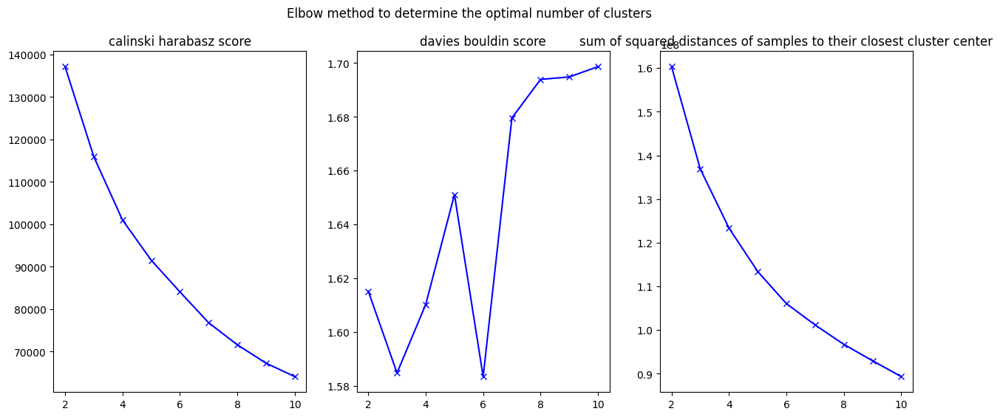

In [ ]:
elbow(range(2,11),X_type_std)

In [ ]:
import pandas as pd
result_kmeans_score_df = pd.DataFrame(index=['6_cluster','7_cluster','8_cluster','9_cluster','9_cluster','10_cluster'])

Selected potentially optimum number of clusters: 6,7,8,9,10




In [ ]:
for i,j in zip(range(2,8),['6_cluster','7_cluster','8_cluster','9_cluster','9_cluster','10_cluster']):
  result_kmeans_score_df.loc[j,['ch_kmeans_type_std','db_kmeans_type_std']]  = quality(X_type_std, Kmeans_simple_exc(i,0,X_type_std))
result_kmeans_score_df

,ch_kmeans_type_std,db_kmeans_type_std
6_cluster,137159.930337,1.615146
7_cluster,115959.946905,1.584742
8_cluster,101009.756535,1.610213
9_cluster,84075.378832,1.583374
9_cluster,84075.378832,1.583374
10_cluster,76802.556982,1.679590


**Kmeans with cosine similarity parameter selection**

Kmeans doesn't have a separate implementation based on cosine distance, but if the input data in normalized by the length of the vector-character, then the Euclidean disambiguation becomes cosine. For more details please see [the discussion](https://stats.stackexchange.com/questions/299013/cosine-distance-as-similarity-measure-in-kmeans).


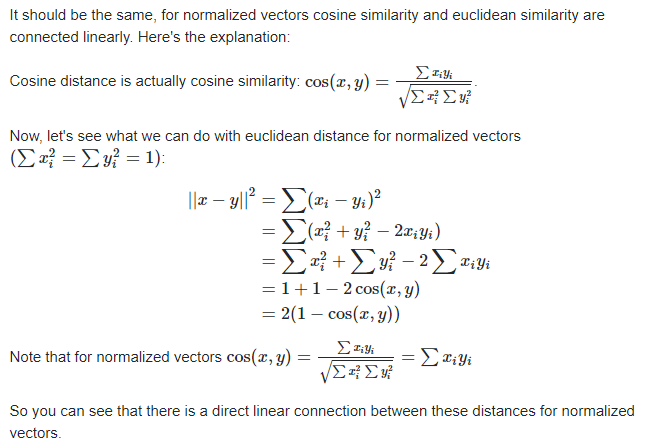

In [ ]:
%%time
import numpy as np

length_type = np.sqrt((X_type**2).sum(axis=1))[:,None]
X_type_normed = X_type / length_type



CPU times: user 414 ms, sys: 2.68 ms, total: 417 ms
Wall time: 417 ms


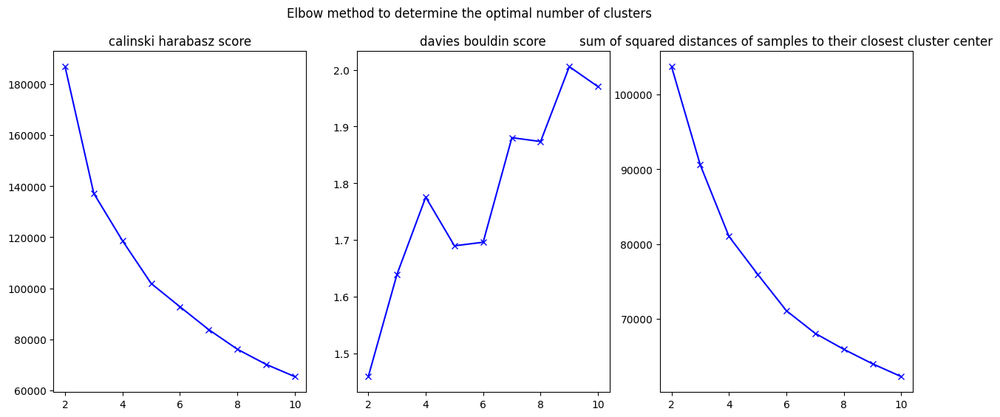

In [ ]:
elbow(range(2,11),X_type_normed)

Selected potentially optimum number of clusters: 6,7,8,9,10

In [ ]:
for i,j in zip(range(2,8),['6_cluster','7_cluster','8_cluster','9_cluster','9_cluster','10_cluster']):
  result_kmeans_score_df.loc[j,['ch_kmeans_type_normed','db_kmeans_type_normed']]  = quality(X_type_normed, Kmeans_simple_exc(i,0,X_type_normed))
result_kmeans_score_df

,ch_kmeans_type_std,db_kmeans_type_std,ch_kmeans_type_normed,db_kmeans_type_normed
6_cluster,137159.930337,1.615146,186867.713004,1.459169
7_cluster,115959.946905,1.584742,137197.717814,1.639580
8_cluster,101009.756535,1.610213,118643.010160,1.775574
9_cluster,84075.378832,1.583374,92766.408057,1.696032
9_cluster,84075.378832,1.583374,92766.408057,1.696032
10_cluster,76802.556982,1.679590,83818.781605,1.880361


**GPU-based TSNE**

First change the runtime environment to GPU in collab.
Then run the code

In [ ]:
 !nvidia-smi

Sun Mar 21 16:53:15 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Install RAPIDS
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!bash rapidsai-csp-utils/colab/rapids-colab.sh stable

import sys, os

dist_package_index = sys.path.index('/usr/local/lib/python3.7/dist-packages')
sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.7/site-packages'] + sys.path[dist_package_index:]
sys.path
exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals())

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 205 (delta 16), reused 3 (delta 0), pack-reused 171
Receiving objects: 100% (205/205), 62.72 KiB | 15.68 MiB/s, done.
Resolving deltas: 100% (78/78), done.
PLEASE READ
********************************************************************************************************
Changes:
1. IMPORTANT SCRIPT CHANGES: Colab has updated to Python 3.7, and now runs our STABLE and NIGHTLY versions (0.18 and 0.19)!  PLEASE update your older install script code as follows:
	!bash rapidsai-csp-utils/colab/rapids-colab.sh 0.18

	import sys, os

	dist_package_index = sys.path.index('/usr/local/lib/python3.7/dist-packages')
	sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.7/site-packages'] + sys.path[dist_package_index:]
	sys.path
	exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals

First, let's check that tsne from cuml gives similar results to the scikitlearn

[W] [17:53:35.154574] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


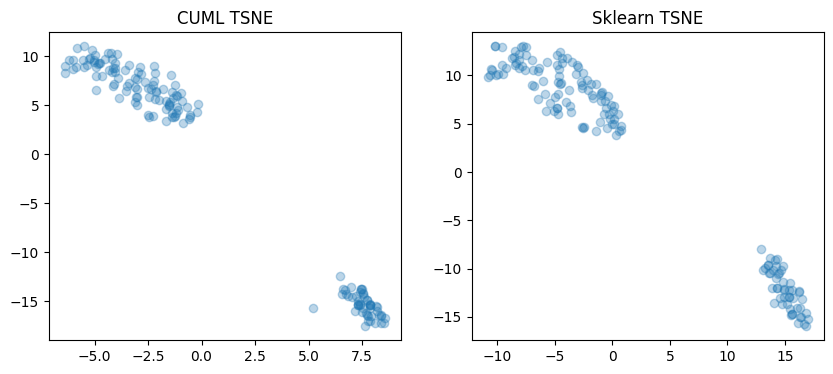

In [ ]:
# The test idea and TSNE parameters are sourced from cuml https://github.com/rapidsai/cuml/issues/2595

from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE as sklTSNE
from cuml.manifold import TSNE
import numpy as np
import pandas as pd
import cudf
import matplotlib.pyplot as plt
%matplotlib inline

the_data = datasets.load_iris()
dataset = the_data.data
scaler = StandardScaler()
dataset = scaler.fit_transform(dataset)

tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000,random_state=1234)
X_embedded_cuml = np.array( tsne.fit_transform(cudf.DataFrame.from_pandas(pd.DataFrame(dataset))).to_pandas() )

#Sklearn
tsne_ = sklTSNE(random_state=1234)
X_embedded = tsne_.fit_transform(dataset)


plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(10,4)
[ax1, ax2]=axs
axs[0].scatter(X_embedded_cuml[:,0],X_embedded_cuml[:,1], alpha=0.3)
axs[0].set_title('CUML TSNE')
axs[1].scatter(X_embedded[:,0],X_embedded[:,1], alpha=0.3)
axs[1].set_title('Sklearn TSNE')
plt.show()

T-sne from cuml library with the following parameters: learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000,random_state=1234 gives similar results to sklearn implementation. And since it has significantly higher performance, we will use it to solve our problem.

In [ ]:
%%time
from cuml.manifold import TSNE
tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000)
X_type_tsne = tsne.fit_transform(X_type)


[W] [17:53:41.879397] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 18.1 s, sys: 19.2 s, total: 37.3 s
Wall time: 37.1 s


In [ ]:
def tsne_transformation(data):
    from cuml.manifold import TSNE
    tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000)
    X_tsne = tsne.fit_transform(X_type)
    return X_tsne

X_type_std_tsne = tsne_transformation(X_type_std)
X_type_normed_tsne = tsne_transformation(X_type_normed)

[W] [17:55:25.064231] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[W] [17:56:01.774580] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


In [ ]:
#the code is for generation of TSNE treated data sets to use in relevant notbooks for those who is not able to use the GPU-based TSNE 

import numpy as np
from sklearn.preprocessing import StandardScaler
import pandas as pd

#type
# scaler = StandardScaler()
# X_type_std = scaler.fit_transform(X_type)

# length_type = np.sqrt((X_type**2).sum(axis=1))[:,None]
# X_type_normed = X_type / length_type

# X_type_std_tsne = tsne_transformation(X_type_std)
# pd.DataFrame(X_type_std_tsne).to_csv('X_type_std_tsne',index=False)
# X_type_normed_tsne = tsne_transformation(X_type_normed)
# pd.DataFrame(X_type_normed_tsne).to_csv('X_type_normed_tsne',index=False)

#osnet
# scaler = StandardScaler()
# X_osnet_std = scaler.fit_transform(X_osnet)

length_osnet = np.sqrt((X_osnet**2).sum(axis=1))[:,None]
X_osnet_normed = X_osnet / length_osnet

# X_osnet_std_tsne = tsne_transformation(X_osnet_std)
# pd.DataFrame(X_osnet_std_tsne).to_csv('X_osnet_std_tsne',index=False)
X_osnet_normed_tsne = tsne_transformation(X_osnet_normed)
pd.DataFrame(X_osnet_normed_tsne).to_csv('X_osnet_normed_tsne',index=False)
#efficientnet
scaler = StandardScaler()
X_efficientnet_std = scaler.fit_transform(X_efficientnet)

length_efficientnet = np.sqrt((X_efficientnet**2).sum(axis=1))[:,None]
X_efficientnet_normed = X_efficientnet / length_efficientnet

X_efficientnet_std_tsne = tsne_transformation(X_efficientnet_std)
pd.DataFrame(X_efficientnet_std_tsne).to_csv('X_efficientnet_std_tsne',index=False)

X_efficientnet_normed_tsne = tsne_transformation(X_efficientnet_normed)
pd.DataFrame(X_efficientnet_normed_tsne).to_csv('X_efficientnet_normed_tsne',index=False)

NameError: ignored

In [ ]:
X_type

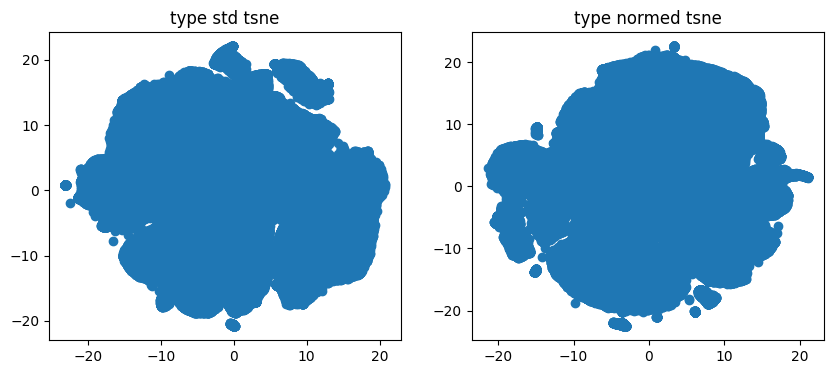

In [ ]:

# To plot the embedding
import matplotlib.pyplot as plt
%matplotlib inline
# plt.scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1])


plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(10,4)
[ax1, ax2]=axs

axs[0].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1])
axs[0].set_title('type std tsne')
axs[1].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1])
axs[1].set_title('type normed tsne')
plt.show()

II. Preparation of the study data base through pca compression

In [ ]:
for i in range(2,8):
    print('\033[1mNumber of principal components:\033[0m',i)
    pca = PCA(n_components = i)
    pca.fit_transform(X_type)
    print('Fraction of variance explained by principal components: {}'.format(pca.explained_variance_ratio_))
    print('Total fraction of variance explained by principal components', round(sum(pca.explained_variance_ratio_),3))

Number of principal components: 2
Fraction of variance explained by principal components: [0.39271297 0.15343245]
Total fraction of variance explained by principal components 0.546
Number of principal components: 3
Fraction of variance explained by principal components: [0.39271279 0.15343238 0.0918074 ]
Total fraction of variance explained by principal components 0.638
Number of principal components: 4
Fraction of variance explained by principal components: [0.39271279 0.15343229 0.09180742 0.05368375]
Total fraction of variance explained by principal components 0.692
Number of principal components: 5
Fraction of variance explained by principal components: [0.39271297 0.15343217 0.09180745 0.05368374 0.04827287]
Total fraction of variance explained by principal components 0.74
Number of principal components: 6
Fraction of variance explained by principal components: [0.39271297 0.15343243 0.09180744 0.05368369 0.04827289 0.04669742]
Total fraction of variance explained by principal com

It is optimal to choose 6 principal components, because the greater number of gives the slower growth rate of variance explained

(416314, 7)
Fraction of variance explained by principal components: [0.39271297 0.1534324  0.09180744 0.05368371 0.04827289 0.04669741
 0.02303141]
Total fraction of variance explained by principal components 0.81


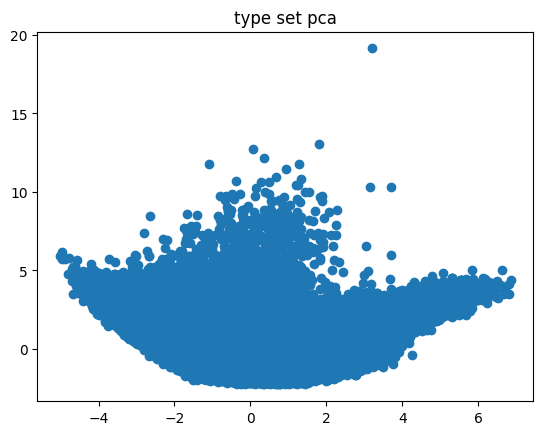

In [ ]:
from sklearn.decomposition import PCA


pca = PCA(n_components = 7)
PCA_X_type_reduced = pca.fit_transform(X_type)
print(PCA_X_type_reduced.shape)
print('Fraction of variance explained by principal components: {}'.format(pca.explained_variance_ratio_))
print('Total fraction of variance explained by principal components', round(sum(pca.explained_variance_ratio_),3))
plt.scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1])
plt.title('type set pca')
plt.show()

In [ ]:
kmeans_5_cluster_type_std = Kmeans_simple_exc(5,0,X_type_std)
kmeans_6_cluster_type_std = Kmeans_simple_exc(6,0,X_type_std)
kmeans_7_cluster_type_std = Kmeans_simple_exc(7,0,X_type_std)

kmeans_5_cluster_type_normed = Kmeans_simple_exc(5,0,X_type_normed)
kmeans_6_cluster_type_normed = Kmeans_simple_exc(6,0,X_type_normed)
kmeans_7_cluster_type_normed = Kmeans_simple_exc(7,0,X_type_normed)

print('\033[1mkmeans_5_cluster_type_std\033[0m')
print_quantity_clusters(kmeans_5_cluster_type_std)

print('\033[1mkmeans_6_cluster_type_std\033[0m')
print_quantity_clusters(kmeans_6_cluster_type_std)

print('\033[1mkmeans_7_cluster_type_std\033[0m')
print_quantity_clusters(kmeans_7_cluster_type_std)

print('\033[1mkmeans_5_cluster_type_normed\033[0m')
print_quantity_clusters(kmeans_5_cluster_type_normed)

print('\033[1mkmeans_6_cluster_type_normed\033[0m')
print_quantity_clusters(kmeans_6_cluster_type_normed)

print('\033[1mkmeans_7_cluster_type_normed\033[0m')
print_quantity_clusters(kmeans_7_cluster_type_normed)

kmeans_5_cluster_type_std
[[     0 105802]
 [     1  58397]
 [     2  23401]
 [     3 149626]
 [     4  79088]]
kmeans_6_cluster_type_std
[[     0  37790]
 [     1 103730]
 [     2   3939]
 [     3 139747]
 [     4  73870]
 [     5  57238]]
kmeans_7_cluster_type_std
[[     0  81649]
 [     1  54438]
 [     2  89684]
 [     3  51881]
 [     4 110113]
 [     5  25672]
 [     6   2877]]
kmeans_5_cluster_type_normed
[[     0  90418]
 [     1  33069]
 [     2 128370]
 [     3 100936]
 [     4  63521]]
kmeans_6_cluster_type_normed
[[     0 127304]
 [     1  96297]
 [     2  36007]
 [     3  90042]
 [     4  35271]
 [     5  31393]]
kmeans_7_cluster_type_normed
[[    0 82734]
 [    1 93543]
 [    2 35604]
 [    3 76709]
 [    4 35190]
 [    5 27409]
 [    6 65125]]


**type std 5&6 clusters vs type_normed 5&6 clusters visualisation tsne**

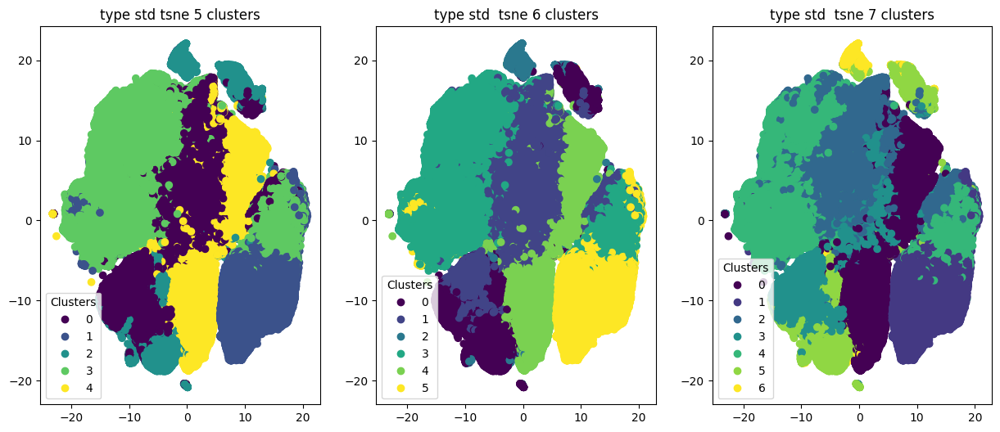

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(15,6)
[ax1, ax2, ax3]=axs

scatter0 = axs[0].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1],c=kmeans_5_cluster_type_std, label=np.unique(kmeans_5_cluster_type_std))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type std tsne 5 clusters')
scatter1 = axs[1].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1],c=kmeans_6_cluster_type_std, label=np.unique(kmeans_6_cluster_type_std))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type std  tsne 6 clusters')
scatter2 = axs[2].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1],c=kmeans_7_cluster_type_std, label=np.unique(kmeans_7_cluster_type_std))
axs[2].legend(*scatter2.legend_elements(),
                    loc="lower left", title="Clusters")
axs[2].set_title('type std  tsne 7 clusters')
plt.show()

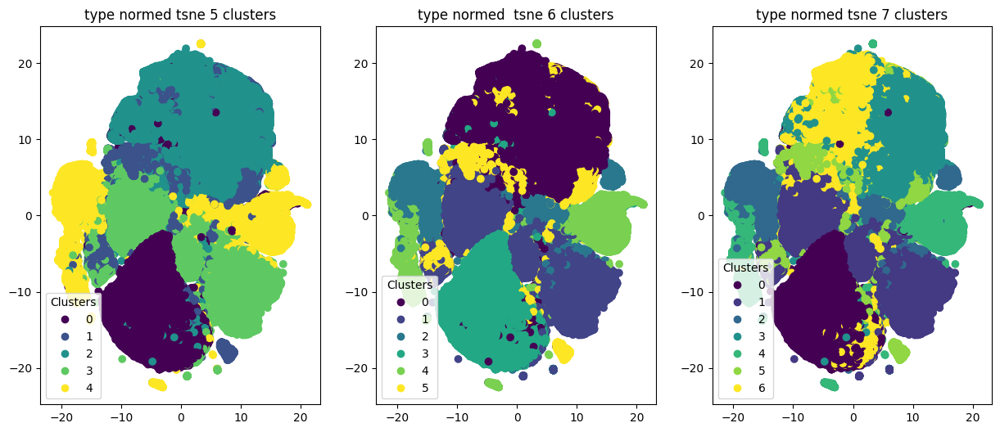

In [ ]:


plt.style.use('default')
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(15,6)
[ax1, ax2, ax3]=axs

scatter0 = axs[0].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1],c=kmeans_5_cluster_type_normed, label=np.unique(kmeans_5_cluster_type_normed))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type normed tsne 5 clusters')
scatter1 = axs[1].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1],c=kmeans_6_cluster_type_normed, label=np.unique(kmeans_6_cluster_type_normed))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type normed  tsne 6 clusters')
scatter2 = axs[2].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1],c=kmeans_7_cluster_type_normed, label=np.unique(kmeans_7_cluster_type_normed))
axs[2].legend(*scatter2.legend_elements(),
                    loc="lower left", title="Clusters")
axs[2].set_title('type normed tsne 7 clusters')
plt.show()

**type std 5&6 clusters vs type_normed 5&6 clusters visualisation pca**

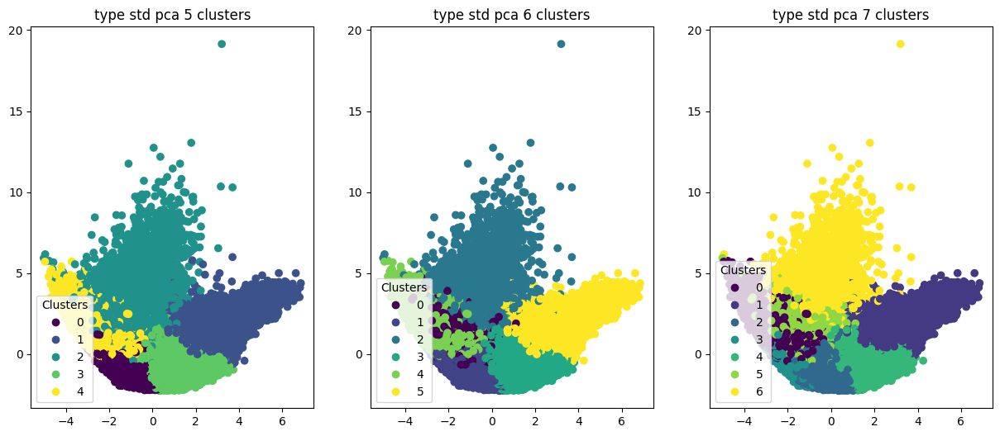

In [ ]:

plt.style.use('default')
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(15,6)
[ax1, ax2, ax3]=axs

scatter0 = axs[0].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_5_cluster_type_std, label=np.unique(kmeans_5_cluster_type_std))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type std pca 5 clusters')
scatter1 = axs[1].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_6_cluster_type_std, label=np.unique(kmeans_6_cluster_type_std))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type std pca 6 clusters')
scatter2 = axs[2].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_7_cluster_type_std, label=np.unique(kmeans_7_cluster_type_std))
axs[2].legend(*scatter2.legend_elements(),
                    loc="lower left", title="Clusters")
axs[2].set_title('type std pca 7 clusters')
plt.show()

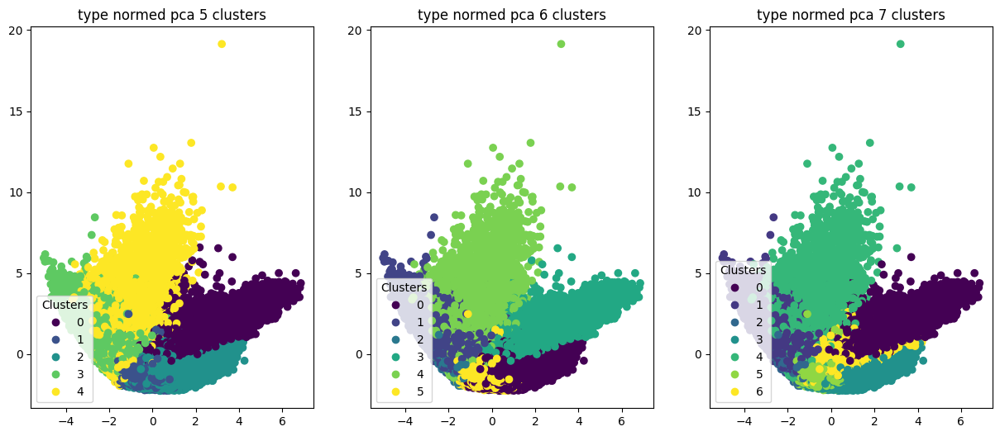

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(15,6)
[ax1, ax2, ax3]=axs

scatter0 = axs[0].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_5_cluster_type_normed, label=np.unique(kmeans_5_cluster_type_normed))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type normed pca 5 clusters')
scatter1 = axs[1].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_6_cluster_type_normed, label=np.unique(kmeans_6_cluster_type_normed))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type normed pca 6 clusters')
scatter2 = axs[2].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_7_cluster_type_normed, label=np.unique(kmeans_7_cluster_type_normed))
axs[2].legend(*scatter2.legend_elements(),
                    loc="lower left", title="Clusters")
axs[2].set_title('type normed pca 7 clusters')
plt.show()

### 3-4 clusters

In [ ]:
kmeans_3_cluster_type_std = Kmeans_simple_exc(3,0,X_type_std)
kmeans_4_cluster_type_std = Kmeans_simple_exc(4,0,X_type_std)

kmeans_3_cluster_type_normed = Kmeans_simple_exc(3,0,X_type_normed)
kmeans_4_cluster_type_normed = Kmeans_simple_exc(4,0,X_type_normed)


print('\033[1mkmeans_3_cluster_type_std\033[0m')
print_quantity_clusters(kmeans_5_cluster_type_std)

print('\033[1mkmeans_4_cluster_type_std\033[0m')
print_quantity_clusters(kmeans_6_cluster_type_std)



print('\033[1mkmeans_3_cluster_type_normed\033[0m')
print_quantity_clusters(kmeans_5_cluster_type_normed)

print('\033[1mkmeans_4_cluster_type_normed\033[0m')
print_quantity_clusters(kmeans_6_cluster_type_normed)



kmeans_3_cluster_type_std
[[     0 105802]
 [     1  58397]
 [     2  23401]
 [     3 149626]
 [     4  79088]]
kmeans_4_cluster_type_std
[[     0  37790]
 [     1 103730]
 [     2   3939]
 [     3 139747]
 [     4  73870]
 [     5  57238]]
kmeans_3_cluster_type_normed
[[     0  90418]
 [     1  33069]
 [     2 128370]
 [     3 100936]
 [     4  63521]]
kmeans_4_cluster_type_normed
[[     0 127304]
 [     1  96297]
 [     2  36007]
 [     3  90042]
 [     4  35271]
 [     5  31393]]


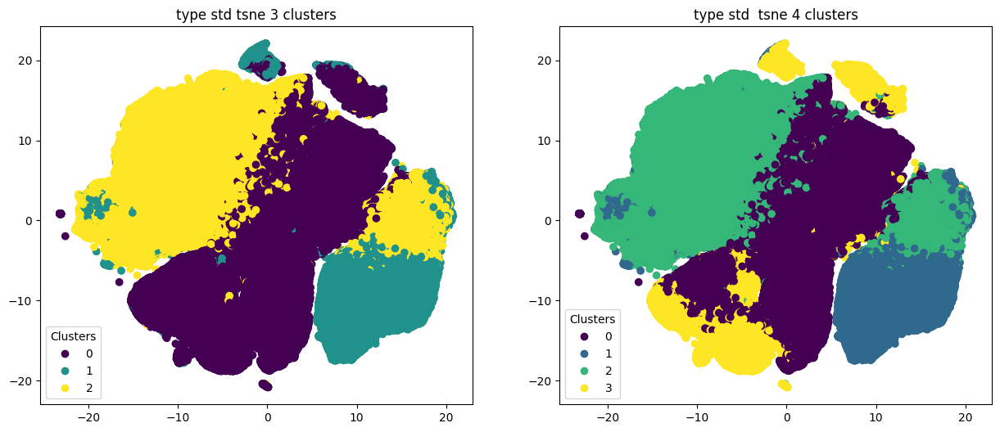

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(15,6)
[ax1, ax2]=axs

scatter0 = axs[0].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1],c=kmeans_3_cluster_type_std, label=np.unique(kmeans_3_cluster_type_std))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type std tsne 3 clusters')
scatter1 = axs[1].scatter(X_type_std_tsne[:,0], X_type_std_tsne[:,1],c=kmeans_4_cluster_type_std, label=np.unique(kmeans_4_cluster_type_std))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type std  tsne 4 clusters')

plt.show()

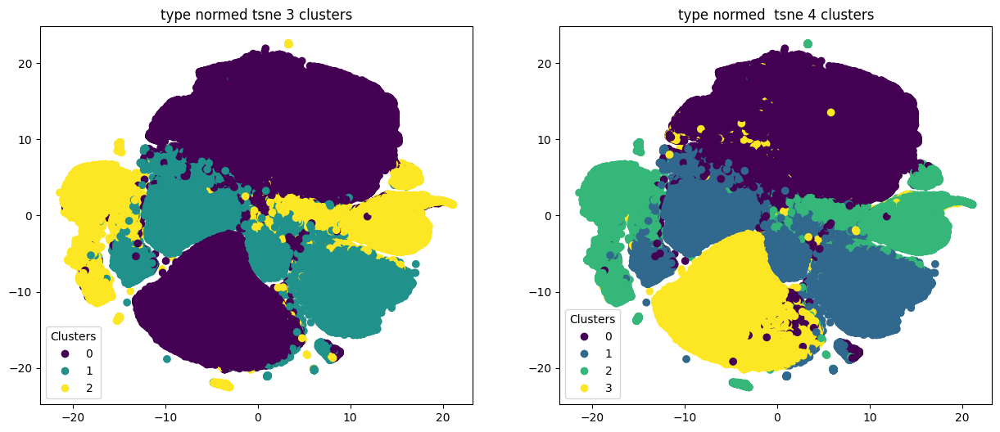

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(15,6)
[ax1, ax2]=axs

scatter0 = axs[0].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1],c=kmeans_3_cluster_type_normed, label=np.unique(kmeans_3_cluster_type_normed))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type normed tsne 3 clusters')
scatter1 = axs[1].scatter(X_type_normed_tsne[:,0], X_type_normed_tsne[:,1],c=kmeans_4_cluster_type_normed, label=np.unique(kmeans_4_cluster_type_normed))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type normed  tsne 4 clusters')

plt.show()

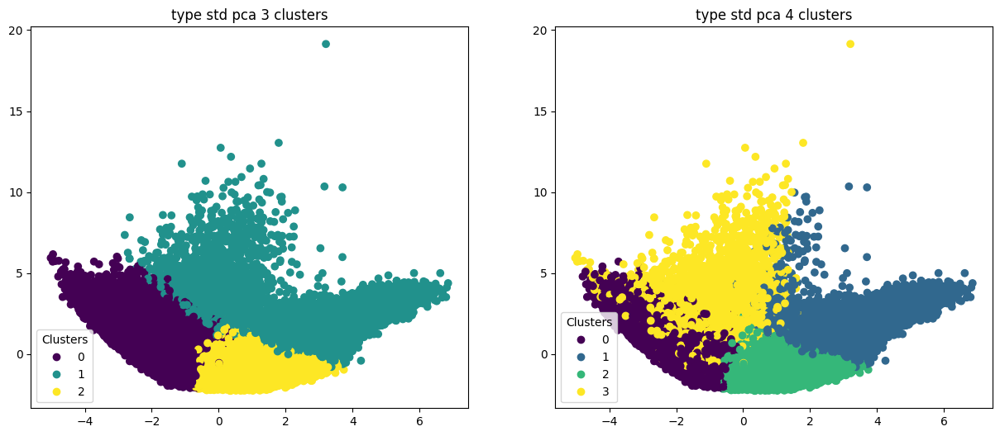

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(15,6)
[ax1, ax2]=axs

scatter0 = axs[0].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_3_cluster_type_std, label=np.unique(kmeans_3_cluster_type_std))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type std pca 3 clusters')
scatter1 = axs[1].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_4_cluster_type_std, label=np.unique(kmeans_4_cluster_type_std))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type std pca 4 clusters')

plt.show()

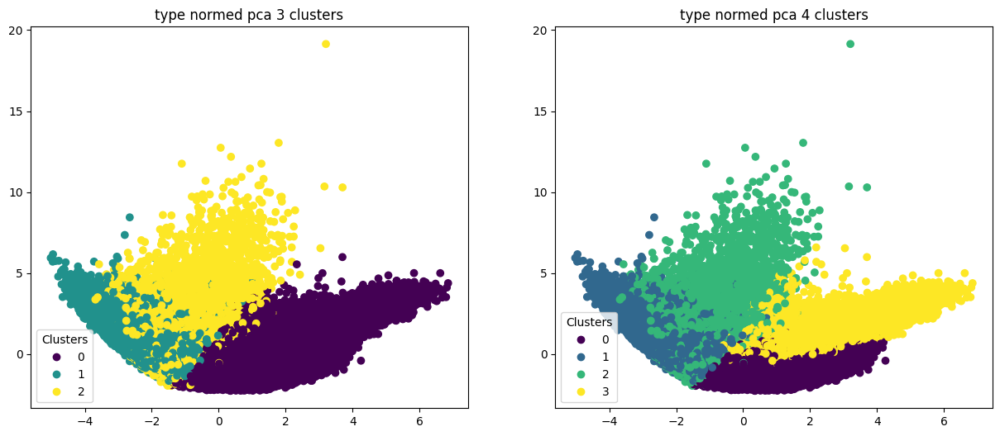

In [ ]:
plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(15,6)
[ax1, ax2]=axs

scatter0 = axs[0].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_3_cluster_type_normed, label=np.unique(kmeans_3_cluster_type_normed))
axs[0].legend(*scatter0.legend_elements(),
                    loc="lower left", title="Clusters")
axs[0].set_title('type normed pca 3 clusters')
scatter1 = axs[1].scatter(PCA_X_type_reduced[:,0], PCA_X_type_reduced[:,1],c=kmeans_4_cluster_type_normed, label=np.unique(kmeans_4_cluster_type_normed))
axs[1].legend(*scatter1.legend_elements(),
                    loc="lower left", title="Clusters")
axs[1].set_title('type normed pca 4 clusters')

plt.show()

### Interpretation

In [ ]:
images_paths = pd.read_csv('/content/drive/MyDrive/01_Hackathon_09/images_paths.csv')
images_paths_parsed = pd.concat([images_paths,images_paths['paths'].str.split('\\',expand=True)],axis=1)
images_paths_parsed[images_paths_parsed.duplicated(subset=[3])]

,paths,0,1,2,3


In [ ]:
images_paths_final = images_paths.copy()
images_paths_final['kmeans_3_cluster_type_std'] = kmeans_3_cluster_type_std
images_paths_final['kmeans_4_cluster_type_std'] = kmeans_4_cluster_type_std
images_paths_final['kmeans_5_cluster_type_std'] = kmeans_5_cluster_type_std
images_paths_final['kmeans_6_cluster_type_std'] = kmeans_6_cluster_type_std
images_paths_final['kmeans_7_cluster_type_std'] = kmeans_7_cluster_type_std
images_paths_final['kmeans_3_cluster_type_normed'] = kmeans_3_cluster_type_normed
images_paths_final['kmeans_4_cluster_type_normed'] = kmeans_4_cluster_type_normed
images_paths_final['kmeans_5_cluster_type_normed'] = kmeans_5_cluster_type_normed
images_paths_final['kmeans_6_cluster_type_normed'] = kmeans_6_cluster_type_normed
images_paths_final['kmeans_7_cluster_type_normed'] = kmeans_7_cluster_type_normed
images_paths_final['paths'] = images_paths_final['paths'].str.replace('\\','/') 
images_paths_final.to_csv('images_paths_final')
images_paths_final.head()

,paths,kmeans_3_cluster_type_std,kmeans_4_cluster_type_std,kmeans_5_cluster_type_std,kmeans_6_cluster_type_std,kmeans_7_cluster_type_std,kmeans_3_cluster_type_normed,kmeans_4_cluster_type_normed,kmeans_5_cluster_type_normed,kmeans_6_cluster_type_normed,kmeans_7_cluster_type_normed
0,veriwild/1/00001/000001.jpg,0,0,4,4,0,1,1,3,1,1
1,veriwild/1/00001/000002.jpg,0,0,4,4,0,1,1,3,1,1
2,veriwild/1/00001/000003.jpg,0,0,0,1,3,1,1,3,1,1
3,veriwild/1/00001/000004.jpg,0,0,4,4,0,1,1,3,1,1
4,veriwild/1/00001/000005.jpg,0,0,0,1,3,1,1,3,1,1


### STD

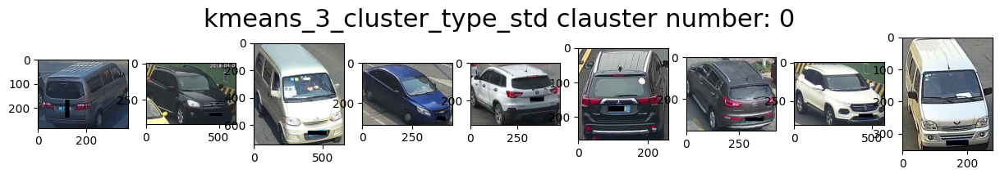

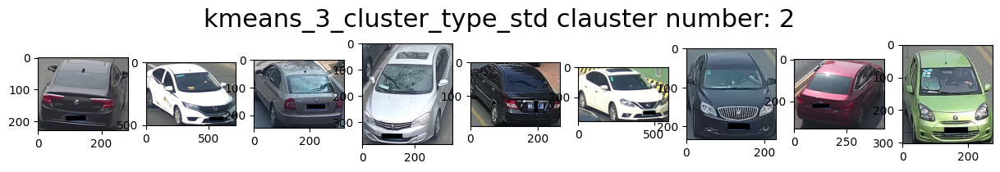

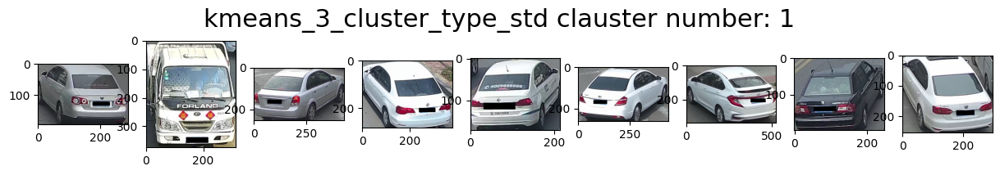

In [ ]:
def plot_9_random_image(data,column,random):
    
#     import skimage
    import skimage.io
    import matplotlib.pyplot as plt
    %matplotlib inline
    for i in data[column].unique():
        plt.style.use('default')
        fig, axs = plt.subplots(1, 9)
        fig.set_size_inches(15,6)
        [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9]=axs
        fig.suptitle(column+ ' clauster number: '+str(i), fontsize=22, y=0.67)
        for k,j in enumerate(data.loc[data[column]==i,'paths'].sample(n=9, random_state=random,replace=False)):
            adress = '/content/drive/MyDrive/01_Hackathon_09/raw_data/veriwild/'+j
            img = skimage.io.imread(adress) # calling io module and specifying the image file name, downloading the image
            axs[k].imshow(img) # plotting the image in the inner pyplot buffer
    plt.show()
    
plot_9_random_image(images_paths_final,'kmeans_3_cluster_type_std',1)

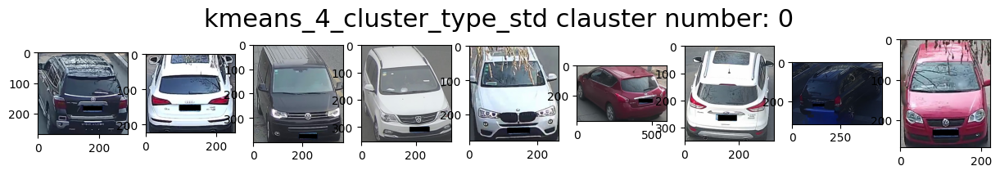

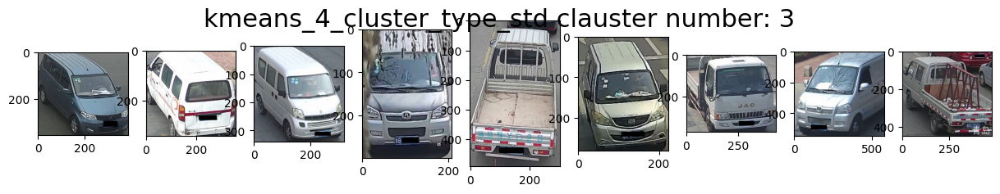

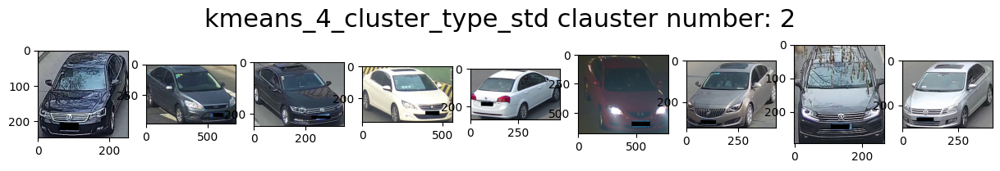

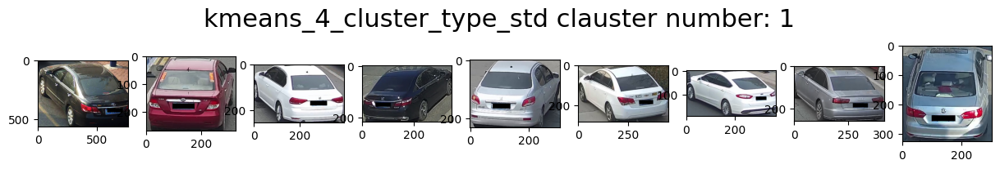

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_4_cluster_type_std',1)

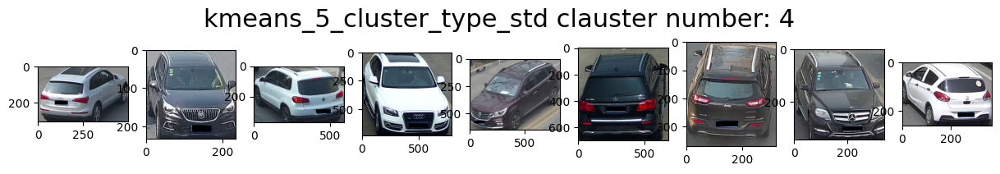

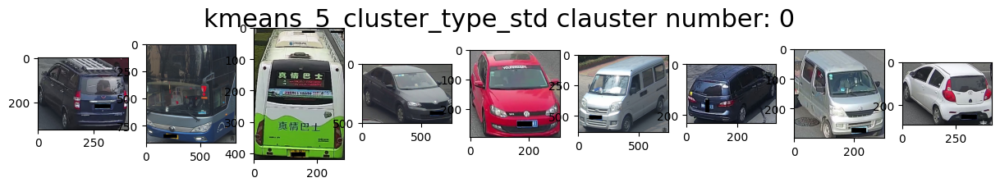

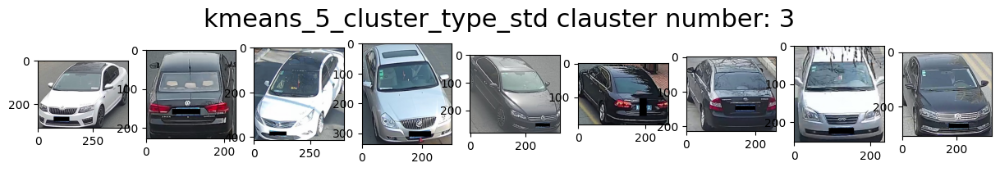

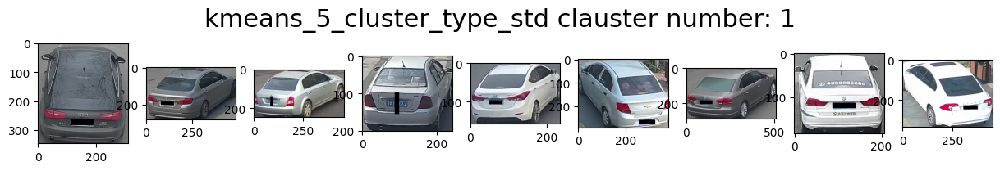

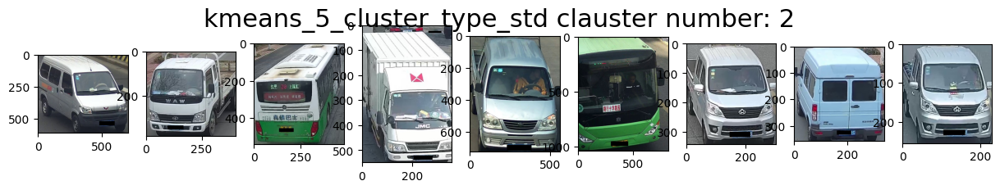

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_5_cluster_type_std',1)

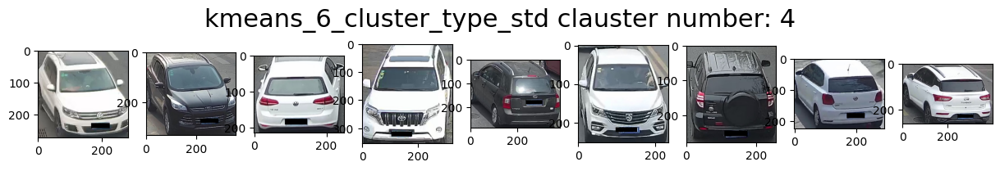

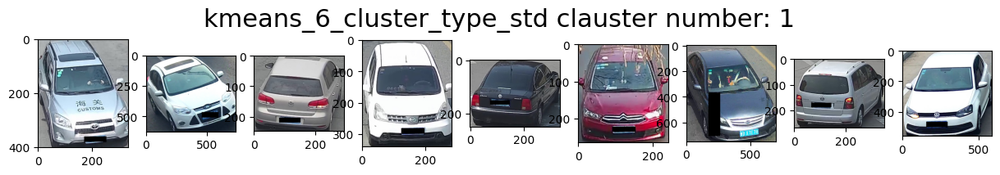

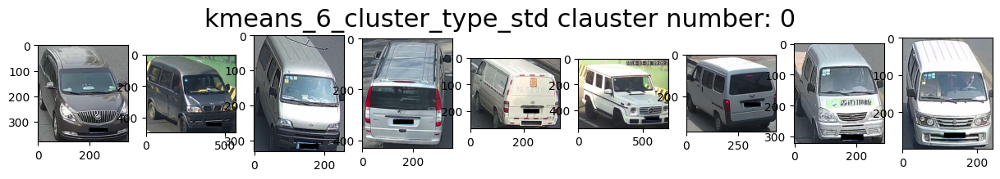

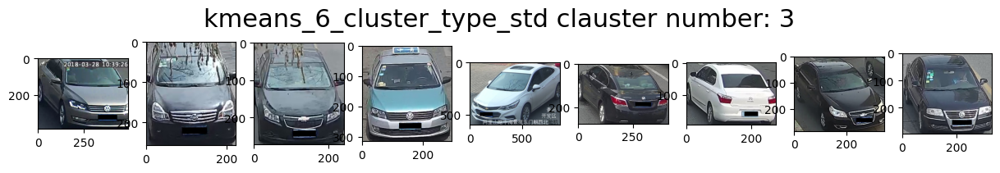

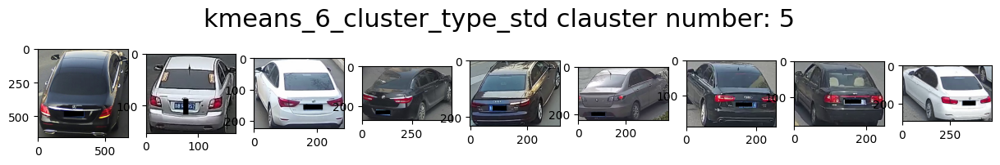

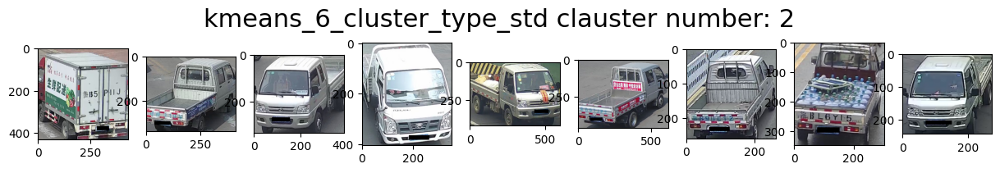

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_6_cluster_type_std',1)

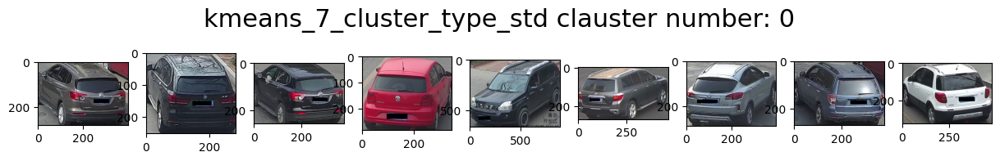

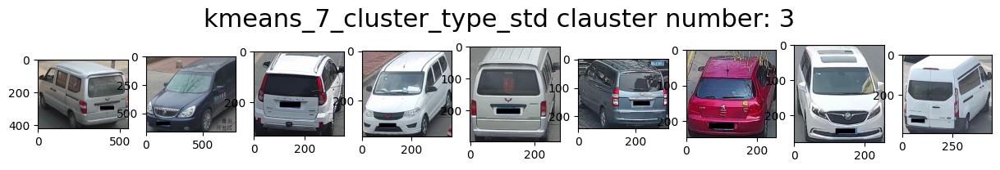

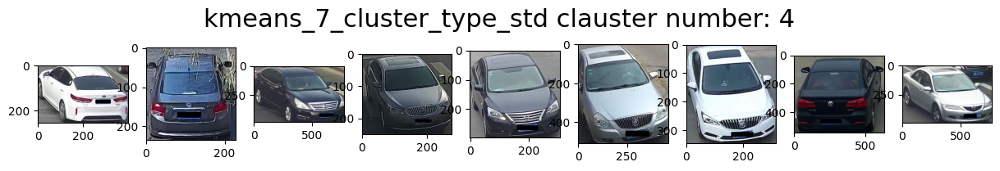

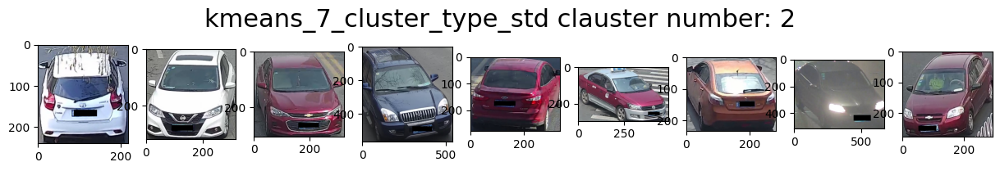

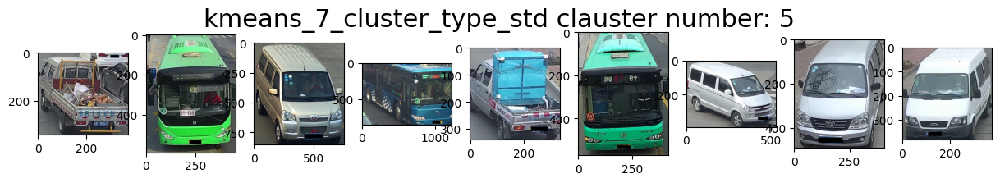

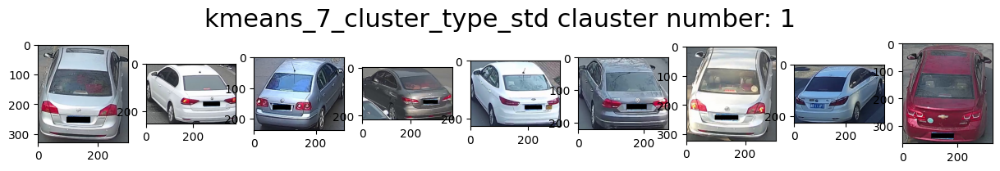

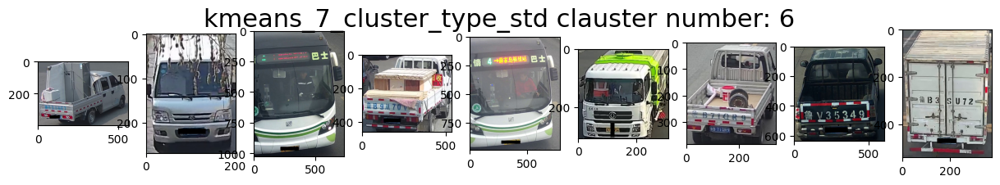

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_7_cluster_type_std',1)

### Normed

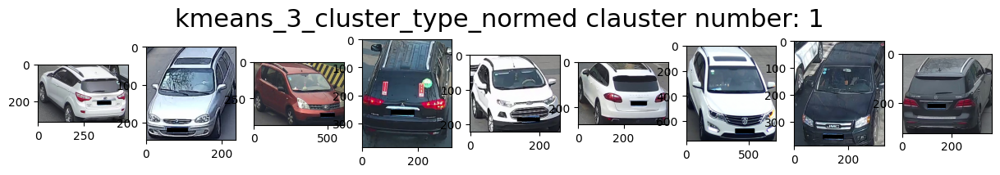

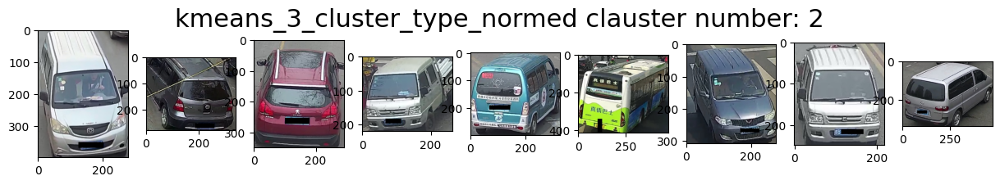

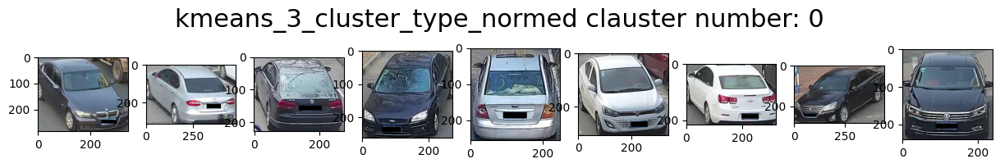

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_3_cluster_type_normed',1)

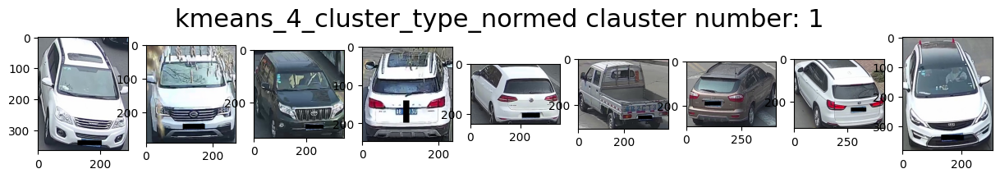

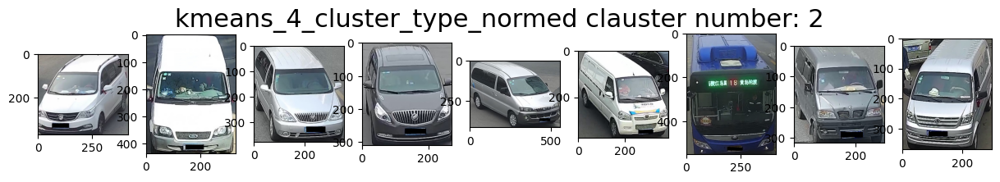

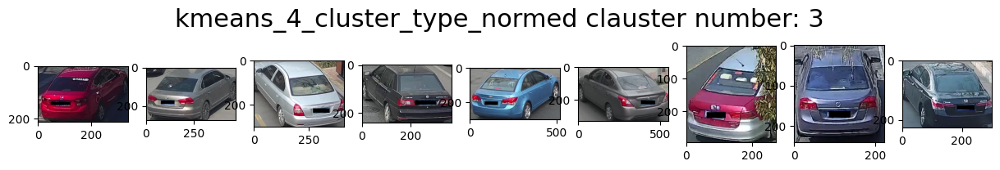

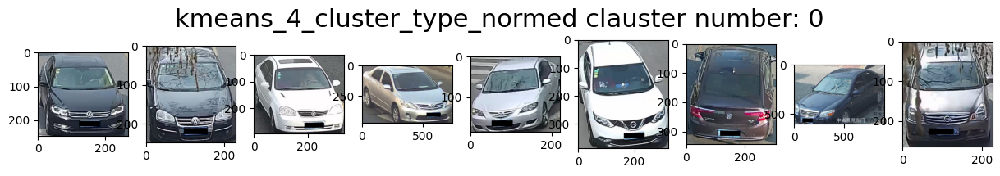

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_4_cluster_type_normed',1)

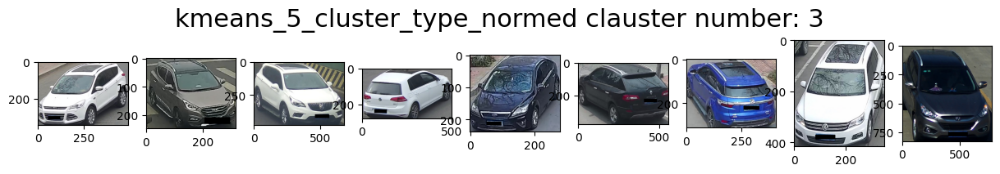

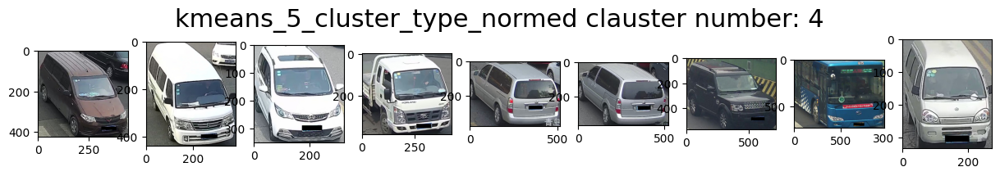

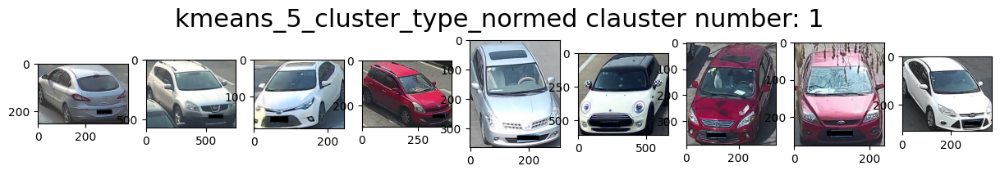

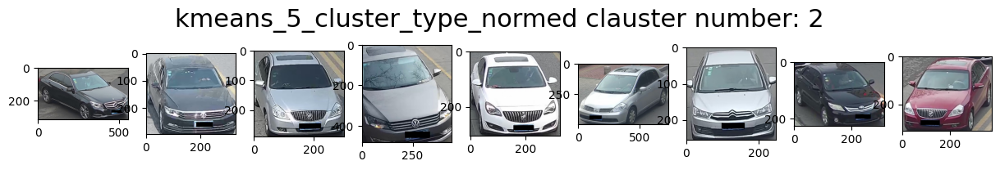

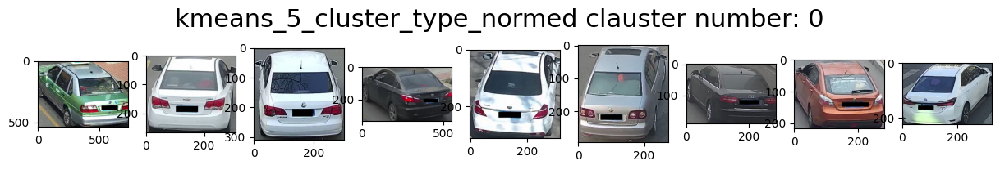

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_5_cluster_type_normed',1)

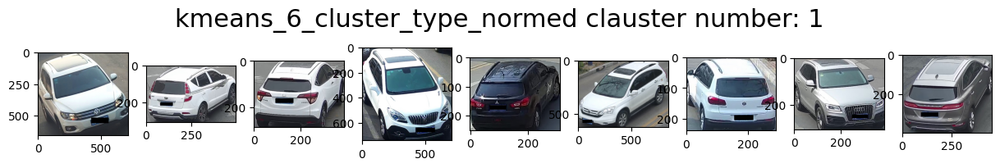

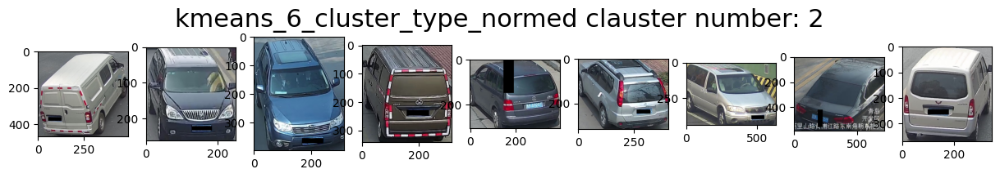

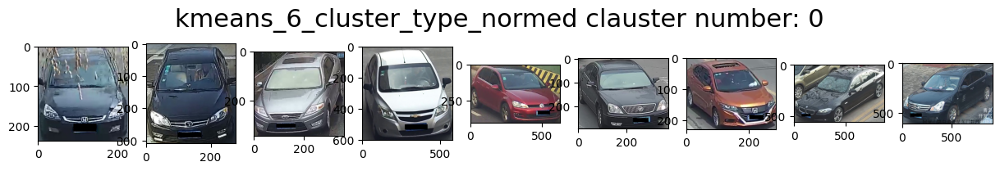

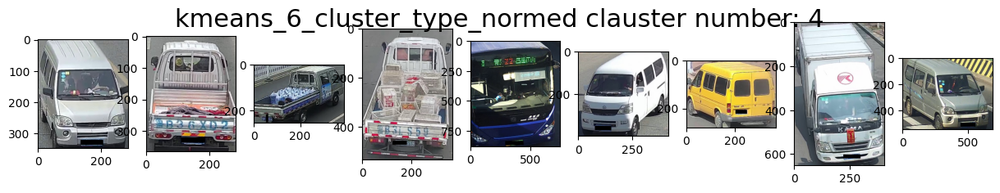

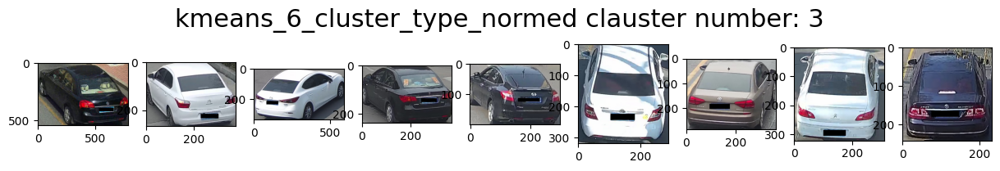

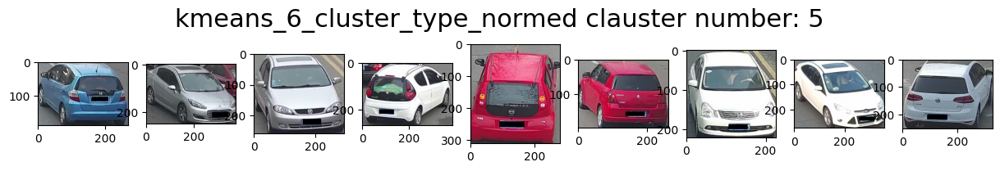

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_6_cluster_type_normed',1)

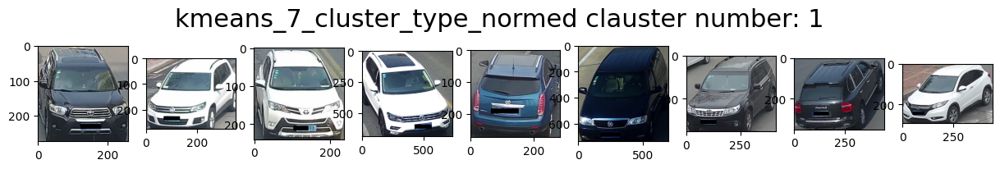

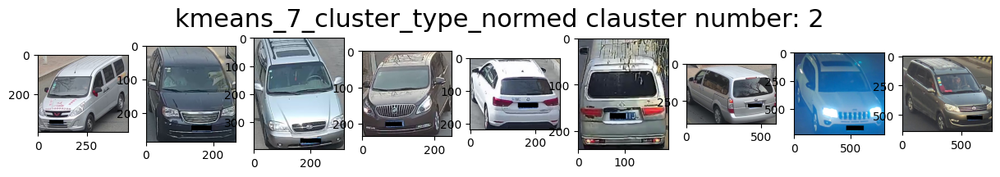

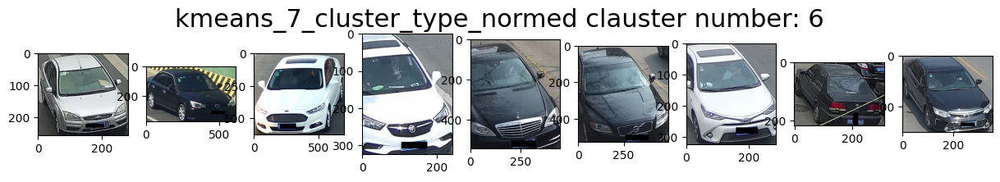

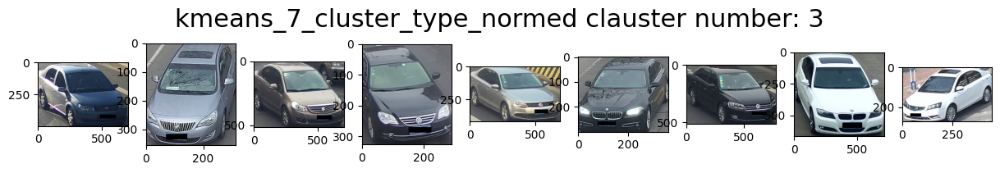

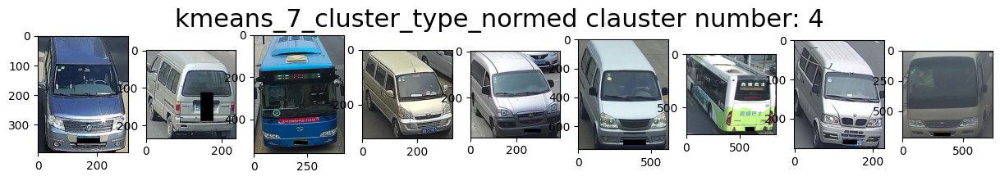

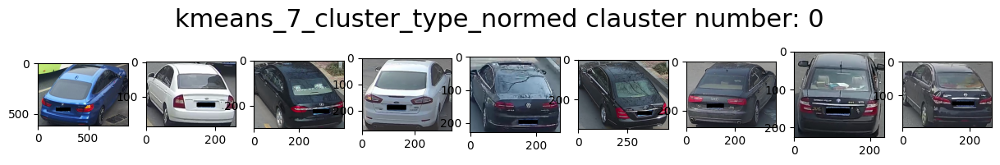

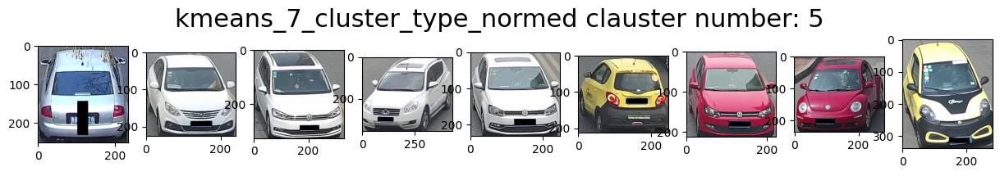

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_7_cluster_type_normed',1)

The expected clustering by vehicle body type based on KMEANS approach was not quite successful, however, in principle the approach for all clusters stably shows the clustering by view (front, rear), e.g. sedans by front and rear view. There is a cluster for the pick-up truck and minivans (clustering by size), with hatchbacks, jeeps in the remaining clusters distinguished poorly. Buses appear in 7 clusters in a group with minivan trucks with noise from previous clustering. Possible solution is to split individual clusters into sub-clusters  

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

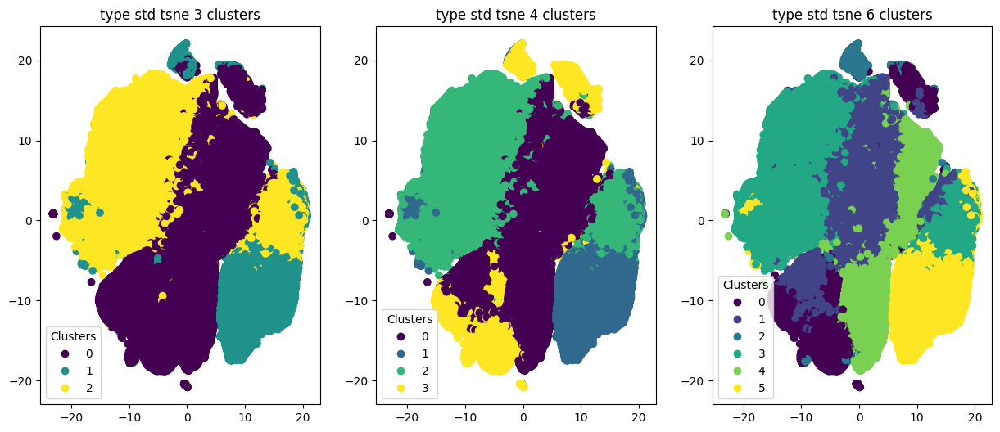

In [ ]:
def plot_n_visualisations(n,data_low_dimentions,cluste_labels_list,title_list):
    plt.style.use('default')
    fig, axs = plt.subplots(1, n)
    fig.set_size_inches(15,6)
    axes_list = ['ax'+str(i) for i in range(1,3+1)]
    axes_list = axs
    for i,j in enumerate(cluste_labels_list):
        scatter = axs[i].scatter(data_low_dimentions[:,0], data_low_dimentions[:,1],c=cluste_labels_list[i], label=np.unique(cluste_labels_list[i]))
        axs[i].legend(*scatter.legend_elements(),
                    loc="lower left", title="Clusters")
        axs[i].set_title(title_list[i])
plot_n_visualisations(3,X_type_std_tsne,[kmeans_3_cluster_type_std,kmeans_4_cluster_type_std,kmeans_6_cluster_type_std],['type std tsne 3 clusters','type std tsne 4 clusters','type std tsne 6 clusters'])